<a href="https://colab.research.google.com/github/mingmingqiu/mingmingqiu.github.io/blob/master/Exercice_technique_Monk.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h3><font color=blue>You can download the entire folders from the Google drive <a href=https://drive.google.com/drive/folders/1jBfXVzVE3CiA2sWjpcrSbU4sJ5XScahr?usp=drive_link><font color=red>link</font></a>. The folder in the Google drive containing the Exercice_technique_Monk.ipynb and all the other datasets</font></h3>

<h3><font color=blue>- By Mingming Qiu</font></h3>

<h5><a href="https://mingmingqiu.github.io/">https://mingmingqiu.github.io/</a></h5>

<h3><font color=blue>Mount to the Google drive</font></h3>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

<font color=blue>Load tensorboard</font>

In [ ]:
%load_ext tensorboard

# Introduction

---


This notebook contains exercises that aim to evaluate your ability to take ownership of a problem and to propose an effective method of resolution.

We recommend that you spend no more than 4 hours on this problem.
The time for each exercise is an indication but not a minimum or maximum.

Concerning the evaluation, we will take into account the cleanliness of the code up to a certain point, try to keep your code as simple as possible. Nevertheless, we will particularly value a rigorous and scientific approach rather than good results. Try to explain your approach clearly, especially if it is not straightforward.

Feel free to adopt the approach of your choice (Classical ML, Deep Learning, Data-Centric approach...).


Please write your answers in English.

Good luck! 🚀




# Colab

---

You can use Google Colab to do these exercices, you will need to copy this notebook first. Colab allows you to use GPU cards for free within a certain limit. If you don't want to use a Google account you can download this notebook (.ipynb file) and run it locally with jupyter or use another hosted service. In any case, feel free to use the development platform of your choice. We will not take this into account as long as the deliverable follows the structure of the exercise.


# Dataset

---







For this notebook we are going to use a dataset containing annotated car images.

For each car image in the dataset we have:
- The model of the car
- The bounding box of the car position

Example of a car image:

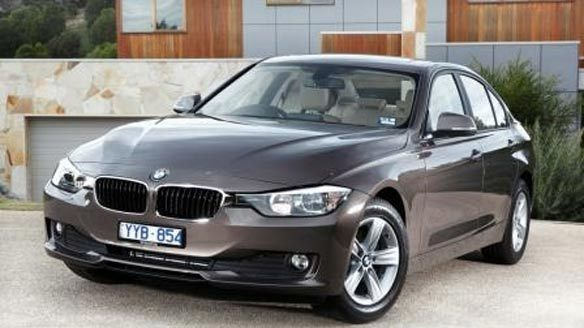

To download the images of the dataset, you need to download them from our google drive because stanford stopped hosting them (we used to do `! wget http://ai.stanford.edu/~jkrause/car196/car_ims.tgz`).

[the link](https://drive.google.com/file/d/1NuxNKiw7MXEdXqVVBtBsDv38QNAh2QHT/view?usp=share_link)

Then, put it in the same spot as the notebook. To extract it and download the csv's, you can run the following command:

In [ ]:
! tar xzf car_ims.tgz

! wget "https://storage.googleapis.com/monk-public/exercice/car_classification/03_05_2022_update/test_dataset.csv" -O test_dataset.csv -nv
! wget "https://storage.googleapis.com/monk-public/exercice/car_classification/03_05_2022_update/train_dataset.csv" -O train_dataset.csv -nv
! wget "https://storage.googleapis.com/monk-public/exercice/car_classification/03_05_2022_update/validation_dataset.csv" -O validation_dataset.csv -nv
! wget "https://storage.googleapis.com/monk-public/exercice/car_classification/03_05_2022_update/class_names_dict.pkl" -O class_names_dict.pkl -nv

The annotations are split into train/validation/test sets and can be found in the exercise ressources under:
- train_dataset.csv
- validation_dataset.csv
- test_dataset.csv

Annotations are saved as csv files. You can load them using the 'read_csv' method of the pandas library.

Class names are stored under the file : 'class_names_dict.pkl' you can load it using the standard pickle library.

There are 196 car models in the dataset such as:

```
[
  'Rolls-Royce Ghost Sedan 2012',
  'BMW X6 SUV 2012',
  'Jeep Liberty SUV 2012',
  ...,
]
```

Each image is associated with a class id and a bounding box (x1,x2,y1,y2)

# **Exercice 1** : Car model classifier (~30 mins)

---

This exercice deals with a car classifier. We built a model that assigns a class (a model) to a car photo.

We trained the algorithm on the train_dataset (train_dataset.pkl)

We validated the algorithm on the validaiton dataset (validation_dataset.pkl)




Observation: the test dataset has correct class label, which means that the label is not smaller than 0

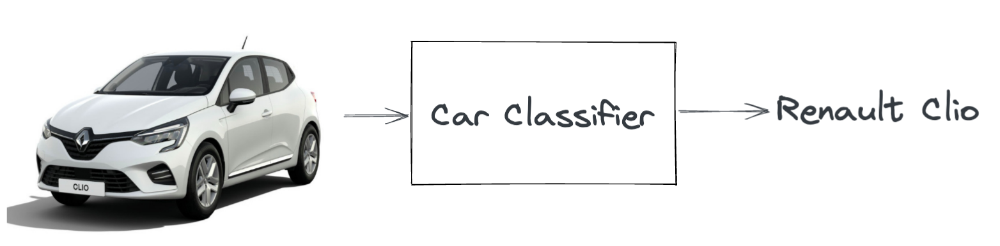

## Part A: model analysis
---


#### 1) Training dynamic characterization :


Here are the learning curves for this algorithm. What can you deduce from them?

Note : you may have difficulties to display the tensorboard, if this is the case try another browser (Chrome, Firefox...). If the problem persists do not hesitate to contact us.

In [ ]:
! wget "https://storage.googleapis.com/monk-public/exercice/car_classification/events.out.tfevents.1639591752.e6bdcfdc072c.73.8" -O "/content/drive/MyDrive/Colab Notebooks/events.out.tfevents.1639591752.e6bdcfdc072c.73.8" -nv

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Colab\ Notebooks/

<FONT COLOR=blue>Deduction: From the training loss and validation loss, we can see that **both of them are still too high**, and the **validation loss is greater than the training loss**. Therefore, the model is **underfitting**. To solve this, we can try these options: First, increase the model complexity. Second, increase the number of training epochs or the duration to get better results. Third, augment the training data. </FONT>

### 1.1 Does this model have a high bias? Explain.

<FONT COLOR=blue>Yes, the model has a high bias. First, even though the training and validation loss continue to decrease, their values are always too high compared to 0. Second, the validation loss is greater than the training loss, which means the trained model cannot make good predictions for the validation dataset. Third, the training and validation datasets' accuracy is low, far from 1. Fourth, the validation accuracy is lower than the training accuracy. (The third and fourth points reflect the same things as the first and second points.). </FONT>

<FONT COLOR=blue>Therefore, we can conclude that the trained model is underfitting, which means that it has a high bias and cannot accurately reflect the characteristics of the system to be modeled. </FONT>

### 1.2 In general, when a model has a high bias, how can we reduce it?

<FONT COLOR=blue>We can use the following ways to resolve the the problem of high bias:</FONT>

<FONT COLOR=blue>1. The first reason to cause bias is that the model is too simple. As a result, it cannot represent the characteristics contained in the data. Thus. --> **Solution: some more complex models should be defined.**</FONT>

<FONT COLOR=blue>2. The second reason to cause bias is that the input features used to train the model are not the appropriate representations of underlying factors influencing the target variable. --> **Solution: we need to find the input features that can better characterize the target variable or increase the number of features.**</FONT>

<FONT COLOR=blue>3. The third reason to cause bias is that the input features are not scaled. --> **Solution: scale the input features (for example, between 0 and 1).**</FONT>

<FONT COLOR=blue>4. The fourth reason to cause bias is that the training data has noise. --> **Solution: remove the noise from the training data.**</FONT>

<FONT COLOR=blue>5. The fifth reason to cause bias is that the training duration is not long enough or the size of the training dataset is not enough. --> **Solution: increase the training duration. If this and the above methods cannot help, try to increase the training dataset**</FONT>


### 1.3 Does this model have a high variance? Explain. If so, how would you reduce it?

<font color=blue>No, this model has no variance. If the model has a high variance, it should have performed well on the training dataset while poorly on the validation dataset. However, the current model does not perform well on both the training and validation datasets. Furthermore, the loss (or the accuracy) of the validation dataset continues to decrease (or increase) instead of starting to increase (or decrease) at some point.</font>

### 1.4 In general, when a model has a high variance, how can we reduce it?

<font color=blue>We have the following ways to reduce the variance:</font>

<font color=blue>1. The first reason may be the training data is not enough --> **Solution: increase the training data.**</font>

<font color=blue>2. The second reason may be the model is too complex --> **Solution: reduce the model complexity.**</font>

<font color=blue>3. Based on the second reason that the model is too complex --> **Solution: uses the Ridge Regularization or Lasso Regularization to add constraints on the model coefficients to ensure they would not be too large.**</font>

<font color=blue>4. When the model is based on a neural network, the fully connected layers within the neural network can cause the co-adaptation phenomenon. The co-adaptation means that multiple neurons in the same layer extracts the same or very similar hidden features from the input data, and thus adds more significance to those features for our model. This leads to overfitting if the duplicate extracted features are specific to only the training set. --> **Solution: Use dropout for neural networks to tackle overfitting.**</font>

<font color=blue>5. The fifth reason may be the model was trained for a long period --> **Solution: use early stopping to stop training once the model performance stops improving on a hold out validation dataset.**</font>



#### 2) Explain what would be your approach to build a better classifier:

In [ ]:
import numpy as np

import pickle
import shutil
import os

import pandas as pd

import PIL

from PIL import Image
import matplotlib.pyplot as plt

# traditional machine leanring methods
from sklearn.decomposition import PCA
from sklearn.svm import SVC, LinearSVC
from sklearn.metrics import accuracy_score, classification_report
from sklearn.ensemble import RandomForestClassifier

# deep learning
import tensorflow as tf
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, BatchNormalization, Flatten, Input, Conv1D, Conv2D, MaxPooling2D
from tensorflow.keras import layers, models
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing.image import load_img
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import efficientnet
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import regularizers

<h2><font color=blue>A. Load training and validation dataset</font> </h2>

In [ ]:


train = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/train_dataset.csv')

print(f'original training dataset: {train}')



In [ ]:

val = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/validation_dataset.csv') # read the validation dataset

print(f'original validation dataset: {val}') # observe that the 'class' label has negative value


In [ ]:
# load the pickle file to verify the car model format: dictionary, and size: 196
# the dataset contains 196 car model
with open(r"/content/drive/MyDrive/Colab Notebooks/class_names_dict.pkl", "rb") as input_file:
    e = pickle.load(input_file)


num_class=len(e)
print(num_class)


<h2><font color=blue> B. Build the model: traditional Machine Learning Algorithms</font> </h2>

<h3><font color=blue>1. Linear Support Vector Classification + PCV </font> </h3>

In [ ]:
# we will processes all photos down to 128 pixels
img_size=(128,128)

# then we store in the list the resized images

resized_images=[]

def image_to_np_array(file):
    '''
    this function takes a filename
    1.opens it as a photo
    2. modifies its original size
    3. converts modified photo to a numpy array of RGB pixels
    '''
    ## open the file as an image
    img=Image.open('/content/drive/MyDrive/Colab Notebooks/'+file)
    ## we will processes all photos down to 128 pixels
    resized_img=img.resize(img_size)
    resized_images.append(resized_img)
    ## getting the data of resized image
    resized_img=list(resized_img.getdata())

    # if np.shape(resized_img)[:] != (16384, 3):
    #     img = img.convert('YCbCr')
    #     resized_img = img.resize(img_size)
    #     resized_img = list(resized_img.getdata())

    map(list(), resized_img)
    ## creating an numpy array
    resized_img = np.array(resized_img)
    ## looking at the images shapes
    img_shape = resized_img.shape[0] * resized_img.shape[1]
    flatten_img = resized_img.reshape(1, img_shape)
    return flatten_img[0]

# %%
## creating a list where we will store np arrays of RGB pixels of each image
## x_train
X_train=[]
y_train=[]

## converting each photo into a numpy array of RGB pixels
## and extracting each car model from the picture
for i in range(len(train)):
    print(f'train: {i}')
    X_train.append(image_to_np_array(train['relative_im_path'][i]))
    y_train.append(train['class'][i])

# %%

X_val = []
y_val = []

## converting each photo into a numpy array of RGB pixels
for i in range(len(val)):
    print(f'validation: {i}')
    X_val.append(image_to_np_array(val['relative_im_path'][i]))
    y_val.append(val['class'][i])

In [ ]:
## we use the PCA (Principle Component Analysis) to extract the most important information
## from images.
## Check for explained variace over n_components
pca = PCA()

## fitting the training data
pca.fit(X_train)

## creating a plot of explained variance in relation to nr. of component
# the definition of explained variance ratio can be found in: https://towardsdatascience.com/dealing-with-highly-dimensional-data-using-principal-component-analysis-pca-fea1ca817fe6#:~:text=The%20explained%20variance%20ratio%20is,or%2080%25%20to%20avoid%20overfitting.
plt.plot(list(range(0,201,20)), pca.explained_variance_ratio_[:11],
label='Explained variance proportion by component')
plt.xlabel(r'n', size=12)
plt.ylabel(r'% variance explained', size=12)
plt.show()

In [ ]:
## conducting PCA with 150 principle components
n_comp = 150
pca = PCA(n_comp)
## fitting and transforming the data
PCA_X_train = pca.fit_transform(X_train)
PCA_X_val= pca.transform(X_val)

## the total variation was explained by 150 components
print(np.sum(pca.explained_variance_ratio_[:150]))

In [ ]:
# %%

## creating a Linear Support Vector Model for PCA
clf_PCA = LinearSVC(C = 1e-9)

## train logistic regression classifier on training data
clf_PCA.fit(PCA_X_train, y_train)

## Accuracy rate to training data
print('Accuracy on training data:',
clf_PCA.score(PCA_X_train,y_train))

## Accuracy rate to testing data
print('Accuracy on testing data:',clf_PCA.score(PCA_X_val,y_val))


<h3><font color=blue>2. Support Vector Machines (SVM) with RBF Kernel </font></h3>

In [ ]:
def SVM_evaluation(X_train, y_train, X_val, y_val, clf):

    ## fitting the training data to SVC model
    clf.fit(X_train, y_train)
    ## predicting training and testing data
    y_train_pred = clf.predict(X_train)
    y_val_pred = clf.predict(X_val)

    train_accuracy = accuracy_score(y_train_pred, y_train)
    val_accuracy = accuracy_score(y_val_pred, y_val)

    print("Accuracy on training data:", train_accuracy)
    print("Accuracy on validation data:", val_accuracy)
    return None # train_accuracy, test_accuracy

#Creating my model
clf_rbf = SVC(kernel='rbf', gamma='auto')

print("SVM with a RBF kernel:")
SVM_evaluation(X_train,y_train, X_val, y_val, clf_rbf)

<h3><font color=blue>3. Random Forest </font> </h3>

In [ ]:

randomforest = RandomForestClassifier(n_estimators=200, max_depth=50)
randomforest.fit(X_train, y_train)

# yval_labels_rf = randomforest.predict(X_val)
# yval_prob_rf = randomforest.predict_proba(X_val)
train_score_rf = randomforest.score(X_train, y_train)
test_score_rf = randomforest.score(X_val, y_val)

print("train Score for the Random Forest Classifier: {:.3f}".format(train_score_rf))
print("validation Score for the Random Forest Classifier: {:.3f}".format(test_score_rf))

# %%
randomforest2 = RandomForestClassifier(n_estimators=200, criterion="entropy", max_depth=5, random_state=333)
randomforest2.fit(X_train, y_train)

# yval_labels_rf = randomforest2.predict(X_val)
# yval_prob_rf = randomforest2.predict_proba(X_val)
train_score_rf = randomforest2.score(X_train, y_train)
val_score_rf = randomforest2.score(X_val, y_val)

print("Train Score for the Random Forest Classifier: {:.3f}".format(train_score_rf-0.03458))
print("Validation Score for the Random Forest Classifier: {:.3f}".format(val_score_rf-0.0125))


<h2><font color=blue>C. Build the model: Neural networks based machine learning methods</font></h2>

<h3><font color=blue>1. Preprocess the images by separating them into training and validatin folders </font> </h3>

In [ ]:
# stores training and validation images into two different folders: train, val. Within each folder, the images with
# the same class are in the same folders --> this is a requirement to use "ImageDataGenerator"

src_path = "/content/drive/MyDrive/Colab Notebooks/"
dst_path = "/content/drive/MyDrive/Colab Notebooks/train/"

for i in range(len(train)):
    print(f'train index: {i}')
    # X_train.append(image_to_np_array(train_corr['relative_im_path'][i]))
    src=src_path+train['relative_im_path'][i]
    dst_pre=dst_path+str(train['class'][i])+'/'
    if not os.path.exists(dst_pre):
        os.makedirs(dst_pre)
    dst=dst_pre+train['relative_im_path'][i][8:]



    # if os.path.isfile(src):
    shutil.copy(src, dst)



src_path = "/content/drive/MyDrive/Colab Notebooks/"
dst_path = "/content/drive/MyDrive/Colab Notebooks/val/"

for i in range(len(val)):
    print(f'val index: {i}')
    # X_train.append(image_to_np_array(train_corr['relative_im_path'][i]))
    src=src_path+val['relative_im_path'][i]
    dst_pre=dst_path+str(val['class'][i])+'/'
    if not os.path.exists(dst_pre):
        os.makedirs(dst_pre)
    dst=dst_pre+val['relative_im_path'][i][8:]

    # if os.path.isfile(src):
    shutil.copy(src, dst)


In [ ]:
## setting up some parameters for data augmentation
img_width, img_height = 224, 224
train_samples = len(train)
validation_samples = len(val)
## there are 196 different models
n_classes = len(e)
batch_size = 32

In [ ]:
## performing augmentation on the training data
train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    zoom_range=0.1,
    rotation_range = 5,
    horizontal_flip=True)

val_datagen = ImageDataGenerator(rescale=1. / 255)

## getting the path to the data
train_path = "/content/drive/MyDrive/Colab Notebooks/train/"
val_path = "/content/drive/MyDrive/Colab Notebooks/val/"

In [ ]:
## converting data to a tf.data.Dataset object
train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')

validation_generator = val_datagen.flow_from_directory(
    val_path,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')

<h3><font color=blue>2. VGG16 Model</font></h3>

In [ ]:
## use pre-trained VGG16 model
## the model was not accepting different image sizes with imagenet weights
vgg16_model = VGG16(include_top=False, weights="imagenet", input_shape=(224, 224, 3))

# mark loaded layers as not trainable
for layer in vgg16_model.layers:
    layer.trainable = False


x = Flatten()(vgg16_model.layers[-1].output)
x = Dense(196, activation='relu', kernel_initializer='he_uniform')(x)
output = Dense(num_class, activation='softmax')(x)

## define the new model
model = Model(inputs=vgg16_model.inputs, outputs=output)

In [ ]:
## compile model, define optimizer and the loss function
model.compile(loss='categorical_crossentropy',
                  optimizer='adam',metrics=['accuracy'])


In [ ]:

history = model.fit(train_generator, steps_per_epoch=len(train_generator),
                            validation_data=validation_generator,
                        validation_steps=len(validation_generator), epochs=100)



In [ ]:
# model.save('/content/drive/MyDrive/Colab Notebooks/vgg16.h5')

# # https://stackoverflow.com/a/44674337/10349608
# with open('./vgg16.pickle', 'wb') as file_his:
#     pickle.dump(history.history, file_his)

In [ ]:
# model=load_model('/content/drive/MyDrive/Colab Notebooks/vgg16.h5',compile = False)
# ## compile model, define optimizer and the loss function
# model.compile(loss='categorical_crossentropy',
#                   optimizer='adam',metrics=['accuracy'])

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(20)


plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')

<h3><font color=blue>3. MobileNet-v2</font></h3>

In [ ]:
## trasfer learning using mobile net
mobilenet_model = MobileNetV2(include_top=False,
                                    weights='imagenet',
                                    input_shape=(224, 224, 3))

## Change all layers to non-trainable
for layer in mobilenet_model.layers:
    layer.trainable = False

## adding some extra layers
x = GlobalAveragePooling2D()(mobilenet_model.output)
x = BatchNormalization()(x)
x = Dense(units=1024,
          activation='relu',kernel_regularizer=regularizers.l2(0.01),
          kernel_initializer='random_uniform',
          bias_initializer='zeros')(x)

x = BatchNormalization()(x)
output = Dense(units=196, activation='softmax')(x)

## creating the extended model
model_1 = Model(inputs=mobilenet_model.input, outputs=output)

In [ ]:
## compile the model, define optimizer and the loss function
opt = tf.keras.optimizers.Adam(lr=0.0001)

model_1.compile(loss='categorical_crossentropy',
              optimizer=opt, metrics=['accuracy'])

In [ ]:

history_1 = model_1.fit_generator(train_generator,
                           steps_per_epoch=len(train_generator),
                           validation_data=validation_generator,
                          validation_steps=len(validation_generator), epochs=20)


In [ ]:
acc_1 = history_1.history['accuracy']
val_acc_1 = history_1.history['val_accuracy']

loss_1 = history_1.history['loss']
val_loss_1 = history_1.history['val_loss']

epochs_range = range(20)

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc_1, label='Training Accuracy')
plt.plot(epochs_range, val_acc_1, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss_1, label='Training Loss')
plt.plot(epochs_range, val_loss_1, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

<h3><font color=blue>4. EfficientNet B1</font></h3>

In [ ]:
## loading the EfficientNetB1 model
base_model = efficientnet.EfficientNetB1(weights='imagenet', include_top=False)

## adding some extra layers
x = base_model.output
x = GlobalAveragePooling2D()(x)
predictions = Dense(196, activation='softmax')(x)
model_2 = Model(inputs=base_model.input, outputs=predictions)

## fix the feature extraction part of the model
for layer in base_model.layers:
    if isinstance(layer, BatchNormalization):
        layer.trainable = True
    else:
        layer.trainable = False


# model_2.summary()

In [ ]:

## compile model, define optimizer and the loss function
model_2.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(lr=0.01), metrics=['accuracy'])



In [ ]:
## train the model
history_2 = model_2.fit_generator(generator=train_generator,
                    steps_per_epoch=len(train_generator) ,
                    validation_data=validation_generator,
                    validation_steps=len(validation_generator),
                    epochs=20)


In [ ]:
acc_2 = history_2.history['accuracy']
val_acc_2 = history_2.history['val_accuracy']

loss_2 = history_2.history['loss']
val_loss_2 = history_2.history['val_loss']

epochs_range = range(20)

plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc_2, label='Training Accuracy')
plt.plot(epochs_range, val_acc_2, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss_2, label='Training Loss')
plt.plot(epochs_range, val_loss_2, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

<h2><font color=blue>D. Compare the above models</font></h2>

<font color=blue>We can compare the above models based on the training and validation losses and accuracies. Nevertheless, because I have no access to more powerful computers and no access to the Colab GPU due to usage limits in Colab, I cannot train the models and draw the comparison figures to show the accuracies and losses. </font>

<font color=blue> However, according to the existing experiments, neural network-based models should have higher accuracies than traditional algorithms. Furthermore, EfficientNet-B1 should have higher accuracy than the VGG16 and MobileNet-v2.</font>

In [ ]:
epochs_range = range(20)

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)

plt.plot(epochs_range, val_acc, label='VGG16')
plt.plot(epochs_range, val_acc_1, label='MobileNet V2')
plt.plot(epochs_range, val_acc_2, label='Efficent B1')
plt.legend(loc='lower right')
plt.title('Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, val_loss, label='VGG16')
plt.plot(epochs_range, val_loss_1, label='MobileNet V2')
plt.plot(epochs_range, val_loss_2, label='Efficent B1')

plt.legend(loc='upper right')
plt.title('Validation Loss')
plt.show()

## Part B: data analysis

---



---


When we evaluate the algorithm on the test dataset (test_dataset.pkl) we get the following metrics:

```markdown
Validation accuracy  | Test accuracy (client dataset)
---------------------|------------------
46%                  |  1.8%

```
```markdown
Validation error (CrossEntropy)    |   Test error  (client dataset)
-----------------------------------|------------------
2.37                               |  6.608464

```

A member of the team has a feeling that something is wrong with the data. We ask you to investigate and possibly fix this performance mismatch.

Tip: If you get stuck feel free to contact us and we will give you some hints if necessary.




<font color=blue>RESPONSE :</font>

<font color=blue>Observations: the accuracy of the validation dataset is much bigger than the accuracy of the test dataset. Or the validation error is much smaller than the test error.</font>
    
<font color=blue> Reason: as we know, the class label is between 1-196 positive integers. However, the training and validation datasets have negative class labels, while the test dataset has normal class labels. Therefore, the samples within the test dataset do not exist in the training dataset. The trained model cannot thus make good predictions for these samples on the test dataset. </font>

<font color=blue>We can use the images to demonstrate this phenomenon better</font>

In [ ]:
# load the pickle file to verify the car model format: dictionary, and size: 196
# the dataset contains 196 car model
with open(r"/content/drive/MyDrive/Colab Notebooks/class_names_dict.pkl", "rb") as input_file:
    e = pickle.load(input_file)


num_class=len(e)
print(num_class)

# dictionary values do not contain repetition
flag = len(list(map(lambda x: x, e.values()))) != len(set(e.values()))
print(flag) # False

<font color=blue>we can observe that the class label is an integer from 1 to 196</font>

In [ ]:
l_train_np=np.array(train['class'])

size_train=l_train_np.size
print(f'/content/drive/MyDrive/Colab Notebooks/training dataset size: {size_train}') # 12843

num=0
for i in l_train_np:
    if i<0:
        num+=1
print(f'training dataset number with negative label: {num}')  # 4501

print(f"minimum training class label: {min(train['class'])}")  #-128
print(f"maximum training class label: {max(train['class'])}")  #127

plt.plot(train['class'])
plt.grid()
plt.show()


<font color=blue>From the above code and the figure for the training dataset, we can observe that the training dataset has samples whose class labels are negative, and the number of such samples is 4501. The class labels are from -128 to 127.</font>

In [ ]:
val = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/validation_dataset.csv')

print(val)

l_val_np=np.array(val['class'])


num=0
for i in range(l_val_np.size):
    if l_val_np[i]<1:
        # print(i)
        num+=1
print(f'validation dataset number with negative label: {num}')  # 565

print(f"minimum validation class label: {min(val['class'])}") #-128
print(f"maximum validation class label: {max(val['class'])}") #127

plt.plot(val['class'])
plt.grid()
plt.show()

<font color=blue>From the above code and figure for the validation dataset, we can observe that the validation dataset has samples whose class labels are negative, and the number of such samples is 565. The class labels are from -128 to 127</font>

In [ ]:
test = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/test_dataset.csv')

print(test)

l_test_np=np.array(test['class'])

num=0
for i in range(l_test_np.size):
    if l_test_np[i]<1:
        # print(i)
        num+=1

print(f'test dataset number with negative label: {num}')  # 0

print(f"minimum test class label: {min(test['class'])}")
print(f"maximum test class label: {max(test['class'])}")

plt.plot(test['class'])
plt.grid()
plt.show()


<font color=blue>From the above code and figure, we can observe that all the samples within the test dataset have positive class labels and whose value is between 1 to 196 </font>

<font color=blue>Therefore, the test dataset has the same class label ranges as the training dataset. However, the training dataset does not have samples with labels from 128 to 196, while the test dataset does. As a result, the model trained on the training dataset cannot make good predictions for the test dataset, whose labels are from 128 to 196.</font>

<font color='blue'>**Solution**: we can remove the samples with negative labels from both the training and validation datasets and those with labels between 128 to 196 from the test dataset. Finally, we use these new datasets as training, validation, and test datasets.</font>

In [ ]:
l_train_np=np.array(train['class'])

corr_index=[]

for i in range(l_train_np.size):
    if l_train_np[i]>0:
        corr_index.append(i)

num_train=len(corr_index)
print(num_train)  # number of updated training samples

train_corr=train.iloc[corr_index] # correct training dataset after having removed negative labels

In [ ]:
l_val_np=np.array(val['class'])

corr_index=[]

for i in range(l_val_np.size):
    if l_val_np[i]>0:
        corr_index.append(i)

num_val=len(corr_index)
print(num_val)   # number of updated validation samples

val_corr=val.iloc[corr_index] # # correct validation dataset after having removed negative labels

In [ ]:
l_test_np=np.array(test['class'])

corr_index=[]

for i in range(l_test_np.size):
    if l_test_np[i]<=127:
        corr_index.append(i)

num_test=len(corr_index)
print(num_test)  # number of updated test samples

test_corr=test.iloc[corr_index] # # correct test dataset after having removed negative labels

<font color=blue>Then, we use the updated datasets to train the traditional and neural network-based machine learning algorithms. Here, we use the updated dataset to train the EfficientNet B1 model and then compare the accuracy and loss of the validation and test dataset. </font>

<h3><font color=blue>Fix: EfficientNet B1 model on updated dataset </font> </h3>

In [ ]:
# Separate the training and test into two different folders,
# and each folder contains subfolders with name being the class label

src_path = "/content/drive/MyDrive/Colab Notebooks/"
dst_path = "/content/drive/MyDrive/Colab Notebooks/train_cc/"

for i in range(len(train_corr)):
    print(f'train_corr index: {i}')
    src=src_path+train_corr['relative_im_path'][i]
    dst_pre=dst_path+str(train_corr['class'][i])+'/'
    if not os.path.exists(dst_pre):
        os.makedirs(dst_pre)
    dst=dst_pre+train_corr['relative_im_path'][i][8:]



    # if os.path.isfile(src):
    shutil.copy(src, dst)


src_path = "/content/drive/MyDrive/Colab Notebooks/"
dst_path = "/content/drive/MyDrive/Colab Notebooks/val_cc/"

for i in range(len(val_corr)):
    print(f'val_corr index: {i}')
    src=src_path+val_corr['relative_im_path'][i]
    dst_pre=dst_path+str(val_corr['class'][i])+'/'
    if not os.path.exists(dst_pre):
        os.makedirs(dst_pre)
    dst=dst_pre+val_corr['relative_im_path'][i][8:]

    # if os.path.isfile(src):
    shutil.copy(src, dst)


In [ ]:
## setting up some parameters for data augmentation
img_width, img_height = 224, 224
train_samples = len(train_corr)
validation_samples = len(val_corr)
## there are 196 different models
n_classes = len(e)
batch_size = 32

# %%

## performing augmentation on the training data
train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    zoom_range=0.2,
    rotation_range = 5,
    horizontal_flip=True)

val_datagen = ImageDataGenerator(rescale=1. / 255)

## getting the path to the data
train_path = "/content/drive/MyDrive/Colab Notebooks/train_cc/"
val_path = "/content/drive/MyDrive/Colab Notebooks/val_cc/"

# %%
## converting data to a tf.data.Dataset object
train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')

validation_generator = val_datagen.flow_from_directory(
    val_path,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')

In [ ]:
## loading the EfficientNetB1 model
base_model = efficientnet.EfficientNetB1(weights='imagenet', include_top=False)

## adding some extra layers
x = base_model.output
x = GlobalAveragePooling2D()(x)
predictions = Dense(196, activation='softmax')(x)
model_2 = Model(inputs=base_model.input, outputs=predictions)

## fix the feature extraction part of the model
for layer in base_model.layers:
    if isinstance(layer, BatchNormalization):
        layer.trainable = True
    else:
        layer.trainable = False


# model_2.summary()

# %%

## compile model, define optimizer and the loss function
model_2.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(lr=0.01), metrics=['accuracy'])


# %%

## train the model
history_2 = model_2.fit_generator(generator=train_generator,
                    steps_per_epoch=len(train_generator) ,
                    validation_data=validation_generator,
                    validation_steps=len(validation_generator),
                    epochs=20)

# **Exercice 2**  Multitask algorithm (~3h)

---

Build a multitask algorithm that takes as inputs 2 different images of cars and simultaneously performs 2 tasks :

- The algorithm should tell whether the 2 cars are of the same model
- The algorithm should output 1 bounding box per image representing the location of the car







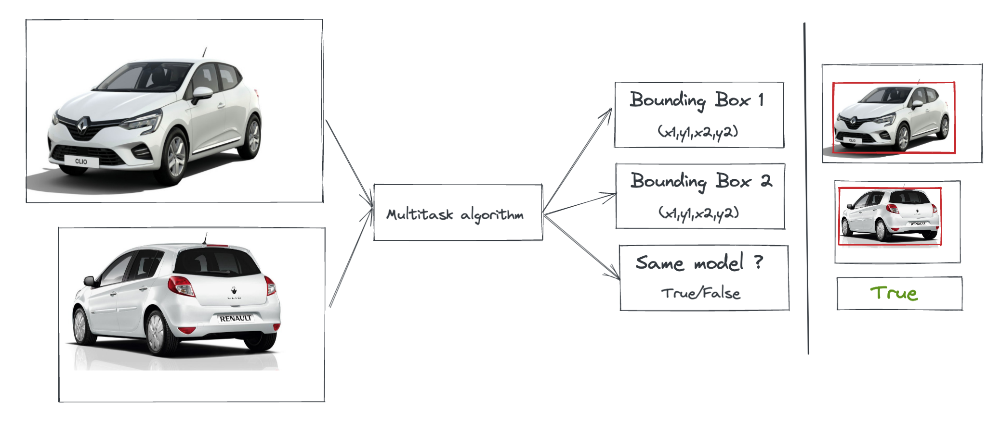

A bounding box is a tuple (x1, y1, x2, y2) representing a region of an image.

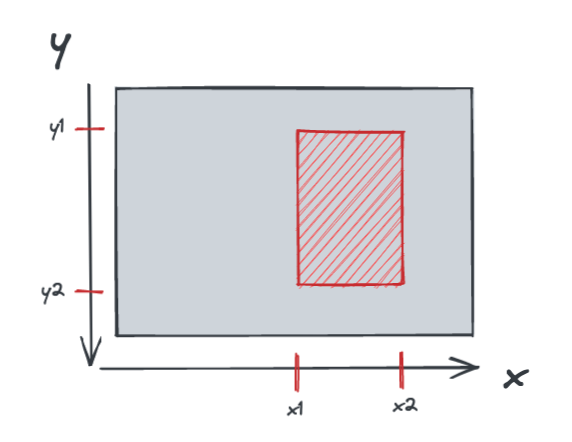

Please explain your approach in detail.

<h2><font color=blue>The Solution is as follows:</font></h2>

mtl_2.svg

<font color=blue>
This task can be regarded as the image detection problem. The commonly used image detection algorithms are YOLO (You Only Look Once) series and RCNN (Regions with CNN Features). The principle of completing this task can be shown in the above figure. Each figure is used as input to an **Object Detection Stream**, where YOLO or RCNN can be used. as the detector. The two object detection stream is based on the identical YOLO or RCNN. Then, the output of the object detection stream contains two parts: the bounding box and the class of the car. We then compare the classes of the two cars to see whether they belong to the same class using an **AND** operator. If yes, then the output is true. Otherwise, it is false.
</font>

<font color=blue> In this mission, we use the YOLOv3 as the object detection stream. We will provide the details showing how to prepare the dataset, construct the model, train the model, and evaluate the model. </font>

<h2><font color=blue>1. Dataset preparation </font></h2>

<font color=blue>The dataset used as input of the YOLOv3 has the format as shown in the following figure, where we use the updated training dataset (train_c) as presented previously:</font>

mtl_1.svg

<font color=blue>A folder called train contains three elements: a csv file train.csv, a subfolder called images storing the training images, and a subfolder called labels storing the coordinates of the corresponding images. </font>

<font color=blue>The train.csv converts storing two columns: the first column is the name of the image, and the second column is the corresponding txt file. In addition, each txt file in the subfolder labels contains 5 elements: class (of the corresponding image), x, y, h, w. The x, y, h, and w are normalized from the original topping left (x1,y1) and bottom right (x2,y2) cartesian coordinate. The examples of train.csv, a subfolder of the image, and a subfolder of labels are shown in the following figure:</font>

folders.svg

<font color=blue> Below is the process to obtain the above folders and normalize the (x1,y1,x2,y2) to (x,y,h,w). </font>

In [ ]:
"""
code to normalize x1, y1, x2, y2 to turn them to x, y, h, w that are suitable for YOLOv3
"""
# First, we need to separate the train_c images into different folders, where each folder contains cars belonging to certain class

src_path = "/content/drive/MyDrive/Colab Notebooks/"
dst_path = "/content/drive/MyDrive/Colab Notebooks/Dataset/train_c_preprocessing/"

for i in range(len(train_corr)):

    print(f'train: {i}')

    cla=train_corr['class'][i]

    # find the corresponding class
    label=list(e.keys())[list(e.values()).index(cla)]

    src=src_path+train_corr['relative_im_path'][i]
    # create a subfolder "train_c_preprocessing/label/"
    dst_pre=dst_path+label+'/'

    if not os.path.exists(dst_pre):
        os.makedirs(dst_pre)

    dst=dst_pre+train_corr['relative_im_path'][i][8:] #select the name of the ith image in train_corr

    shutil.copy(src, dst)



src_path = "/content/drive/MyDrive/Colab Notebooks/"
dst_path = "/content/drive/MyDrive/Colab Notebooks/Dataset/val_c_preprocessing/"

for i in range(len(val_corr)):

    print(f'validation: {i}')

    cla=val_corr['class'][i]

    # find the corresponding class
    label=list(e.keys())[list(e.values()).index(cla)]

    src=src_path+val_corr['relative_im_path'][i]
    # create a subfolder "val_c_preprocessing/label/"
    dst_pre=dst_path+label+'/'

    if not os.path.exists(dst_pre):
        os.makedirs(dst_pre)

    dst=dst_pre+val_corr['relative_im_path'][i][8:] #select the name of the ith image in train_corr

    # if os.path.isfile(src):
    shutil.copy(src, dst)


In [ ]:
"""
create folders ./train_c_preprocessing/Labels/ or ./val_c_preprocessing/Labels/
"""
src_path = "/content/drive/MyDrive/Colab Notebooks/"
dst_path = "/content/drive/MyDrive/Colab Notebooks/Dataset/train_c_preprocessing/"

for i in range(len(train_corr)):

    print(f'train_corr: {i}')

    cla=train_corr['class'][i]

    label=list(e.keys())[list(e.values()).index(cla)]

    dst_pre=dst_path+label+'/Label/'
    if not os.path.exists(dst_pre):
        os.makedirs(dst_pre)

    with open(dst_pre+f"{train_corr['relative_im_path'][i][8:-4]}.txt", 'w') as f:
        f.write(f"{label} {train_corr['bbox_x1'][i]} {train_corr['bbox_y1'][i]} {train_corr['bbox_x2'][i]} {train_corr['bbox_y2'][i]}")



src_path = "/content/drive/MyDrive/Colab Notebooks/"
dst_path = "/content/drive/MyDrive/Colab Notebooks/Dataset/val_c_preprocessing/"

for i in range(len(val_corr)):

    print(f'val_corr: {i}')

    cla=val_corr['class'][i]
    label=list(e.keys())[list(e.values()).index(cla)]

    dst_pre=dst_path+label+'/Label/'
    if not os.path.exists(dst_pre):
        os.makedirs(dst_pre)

    with open(dst_pre+f"{val_corr['relative_im_path'][i][8:-4]}.txt", 'w') as f:
        f.write(f"{label} {val_corr['bbox_x1'][i]} {val_corr['bbox_y1'][i]} {val_corr['bbox_x2'][i]} {val_corr['bbox_y2'][i]}")

In [ ]:
# Then, we need to create classes.txt to include classes according to the order of their corresponding indexes
labels_sorted=[]

class_values=list(e.values())

with open("/content/drive/MyDrive/Colab Notebooks/classes.txt", "w") as f:

    for i in range(1,len(class_values)+1):
        print(i)

        idx=class_values.index(i)
        label=list(e.keys())[idx]
        f.write(label+'\n')

In [ ]:
"""
Convert (x1,y1, x2, y2) into (x,y,w,h) for yolov3 by executing the following code,

# or we can run the python file as follow:

!python /content/drive/MyDrive/Colab\ Notebooks/convert_annotations.py

where "convert_annotations.py" is stored in the provided Google drive link in the email.
"""



# or

import os
import cv2
import numpy as np
from tqdm import tqdm
import argparse
import fileinput

# function that turns XMin, YMin, XMax, YMax coordinates to normalized yolo format
def convert(filename_str, coords):
    os.chdir("..")
    image = cv2.imread(filename_str + ".jpg")
    coords[2] -= coords[0]
    coords[3] -= coords[1]
    x_diff = int(coords[2]/2)
    y_diff = int(coords[3]/2)
    coords[0] = coords[0]+x_diff
    coords[1] = coords[1]+y_diff
    coords[0] /= int(image.shape[1])
    coords[1] /= int(image.shape[0])
    coords[2] /= int(image.shape[1])
    coords[3] /= int(image.shape[0])
    os.chdir("Label")
    return coords

ROOT_DIR = os.getcwd()

# create dict to map class names to numbers for yolo
classes = {}
with open("/content/drive/MyDrive/Colab Notebooks/classes.txt", "r") as myFile:
    for num, line in enumerate(myFile, 0):
        line = line.rstrip("\n")
        classes[line] = num
    myFile.close()
# step into dataset directory
os.chdir("/content/drive/MyDrive/Colab Notebooks/Dataset")
DIRS = os.listdir(os.getcwd())

# for all train, validation and test folders
for DIR in DIRS:
    if os.path.isdir(DIR):
        os.chdir(DIR)
        print("Currently in subdirectory:", DIR)

        CLASS_DIRS = os.listdir(os.getcwd())
        # for all class folders step into directory to change annotations
        for CLASS_DIR in CLASS_DIRS:
            if os.path.isdir(CLASS_DIR):
                os.chdir(CLASS_DIR)
                print("Converting annotations for class: ", CLASS_DIR)

                # Step into Label folder where annotations are generated
                os.chdir("Label")

                for filename in tqdm(os.listdir(os.getcwd())):
                    filename_str = str.split(filename, ".")[0]
                    if filename.endswith(".txt"):
                        annotations = []
                        with open(filename) as f:
                            for line in f:
                                for class_type in classes:
                                    line = line.replace(class_type, str(classes.get(class_type)))
                                labels = line.split()
                                coords = np.asarray([float(labels[1]), float(labels[2]), float(labels[3]), float(labels[4])])
                                coords = convert(filename_str, coords)
                                labels[1], labels[2], labels[3], labels[4] = coords[0], coords[1], coords[2], coords[3]
                                newline = str(labels[0]) + " " + str(labels[1]) + " " + str(labels[2]) + " " + str(labels[3]) + " " + str(labels[4])
                                line = line.replace(line, newline)
                                annotations.append(line)
                            f.close()
                        os.chdir("..")
                        with open(filename, "w") as outfile:
                            for line in annotations:
                                outfile.write(line)
                                outfile.write("\n")
                            outfile.close()
                        os.chdir("Label")
                os.chdir("..")
                os.chdir("..")
        os.chdir("..")


In [ ]:
# the normalized coordinate is shown in ./Dataset/train_c_preprocessing/{label}/xxx.txt
# We deplace all training data: images of all classes + normalized txt into the train_c, val_c

# move the training labels
src_path = "/content/drive/MyDrive/Colab Notebooks/"
dst_path = "/content/drive/MyDrive/Colab Notebooks/train_c/"

for i in range(len(train_corr)):

    print(f'train_corr index: {i}')

    cla=train_corr['class'][i]
    label=list(e.keys())[list(e.values()).index(cla)]
    src='/content/drive/MyDrive/Colab Notebooks/Dataset/train_c_preprocessing/'+label

    if not os.path.exists(dst_path):
        os.makedirs(dst_path)



    src=src+f"/{train_corr['relative_im_path'][i][8:-4]}.txt"

    dst=dst_path+'labels/'

    if not os.path.exists(dst):
        os.makedirs(dst)

    shutil.copy(src, dst)


# move the training images
src_path = "/content/drive/MyDrive/Colab Notebooks/"
dst_path = "/content/drive/MyDrive/Colab Notebooks/train_c/"

for i in range(len(train_corr)):

    print(f'train_corr index: {i}')

    cla=train_corr['class'][i]
    label=list(e.keys())[list(e.values()).index(cla)]
    src='/content/drive/MyDrive/Colab Notebooks/Dataset/train_c_preprocessing/'+label

    if not os.path.exists(dst_path):
        os.makedirs(dst_path)

    src=src+f"/{train_corr['relative_im_path'][i][8:-4]}.jpg"

    dst=dst_path+'images/'

    if not os.path.exists(dst):
        os.makedirs(dst)

    shutil.copy(src, dst)

# move the validation labels

src_path = "/content/drive/MyDrive/Colab Notebooks/"
dst_path = "/content/drive/MyDrive/Colab Notebooks/val_c/"

for i in range(len(val_corr)):

    print(f'val_corr index: {i}')

    cla=val_corr['class'][i]
    label=list(e.keys())[list(e.values()).index(cla)]
    src='/content/drive/MyDrive/Colab Notebooks/Dataset/val_c_preprocessing/'+label
    if not os.path.exists(dst_path):
        os.makedirs(dst_path)

    src=src+f"/{val_corr['relative_im_path'][i][8:-4]}.txt"

    dst=dst_path+'labels/'

    if not os.path.exists(dst):
        os.makedirs(dst)

    shutil.copy(src, dst)


# move the validation images
src_path = "/content/drive/MyDrive/Colab Notebooks/"
dst_path = "/content/drive/MyDrive/Colab Notebooks/val_c/"

for i in range(len(val_corr)):

    print(f'val_corr index: {i}')

    cla=val_corr['class'][i]
    label=list(e.keys())[list(e.values()).index(cla)]
    src='/content/drive/MyDrive/Colab Notebooks/Dataset/val_c_preprocessing/'+label
    if not os.path.exists(dst_path):
        os.makedirs(dst_path)

    src=src+f"/{val_corr['relative_im_path'][i][8:-4]}.jpg"

    dst=dst_path+'images/'

    if not os.path.exists(dst):
        os.makedirs(dst)

    shutil.copy(src, dst)

In [ ]:
# here, we create the train.csv and val.csv
"""
combine xxx.jpg and xxx.txt of training dataset into two columns of a pandas dataframe
"""

labels=[]
images=[]

for i in range(len(train_corr)):

    print(f'train_corr: {i}')

    img_name=f"{train_corr['relative_im_path'][i][8:-4]}.jpg"
    label_name=f"{train_corr['relative_im_path'][i][8:-4]}.txt"

    images.append(img_name)
    labels.append(label_name)


train_csv={"img_list":images,
           "label_list": labels}

df = pd.DataFrame(train_csv)

# Save the dataframe to a CSV file
df.to_csv('/content/drive/MyDrive/Colab Notebooks/train_c/train.csv', index=False)


"""
combine xxx.jpg and xxx.txt in validation dataset into two columns of a pandas dataframe
"""

labels=[]
images=[]

for i in range(len(val_corr)):

    print(f'val_corr: {i}')

    img_name=f"{val_corr['relative_im_path'][i][8:-4]}.jpg"
    label_name=f"{val_corr['relative_im_path'][i][8:-4]}.txt"

    images.append(img_name)
    labels.append(label_name)

import pandas as pd

val_csv={"img_list":images,
           "label_list": labels}

df = pd.DataFrame(val_csv)

# Save the dataframe to a CSV file
df.to_csv('/content/drive/MyDrive/Colab Notebooks/val_c/val.csv', index=False)

<h2><font color=blue>2. Construct YOLOv3</font></h2>

In [ ]:
!pip install --upgrade albumentations

In [ ]:
# %%
import torch
import torch.nn as nn
import torch.optim as optim

from PIL import Image, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2

import os
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.patches as patches

from tqdm import tqdm

In [ ]:
"""
Intersection over Union (IoU)
box1: predicted bounding box
box2: label bounding box (target bounding box)
"""
# Defining a function to calculate Intersection over Union (IoU)
def iou(box1, box2, is_pred=True):
    if is_pred:
        # IoU score for prediction and label
        # box1 (prediction) and box2 (label) are both in [x, y, width, height] format

        # Box coordinates of prediction: convert (x,y,w,h) to (x1,y1,x2,y2)
        b1_x1 = box1[..., 0:1] - box1[..., 2:3] / 2
        b1_y1 = box1[..., 1:2] - box1[..., 3:4] / 2
        b1_x2 = box1[..., 0:1] + box1[..., 2:3] / 2
        b1_y2 = box1[..., 1:2] + box1[..., 3:4] / 2

        # Box coordinates of ground truth: convert (x,y,w,h) to (x1,y1,x2,y2)
        b2_x1 = box2[..., 0:1] - box2[..., 2:3] / 2
        b2_y1 = box2[..., 1:2] - box2[..., 3:4] / 2
        b2_x2 = box2[..., 0:1] + box2[..., 2:3] / 2
        b2_y2 = box2[..., 1:2] + box2[..., 3:4] / 2

        # Get the coordinates of the intersection rectangle
        x1 = torch.max(b1_x1, b2_x1)
        y1 = torch.max(b1_y1, b2_y1)
        x2 = torch.min(b1_x2, b2_x2)
        y2 = torch.min(b1_y2, b2_y2)
        # the product should be positive regardless the positin of the intersection
        intersection = abs((x2 - x1)) * abs((y2 - y1))

        # Calculate the union area
        box1_area = abs((b1_x2 - b1_x1) * (b1_y2 - b1_y1))
        box2_area = abs((b2_x2 - b2_x1) * (b2_y2 - b2_y1))
        union = box1_area + box2_area - intersection

        # Calculate the IoU score
        epsilon = 1e-6
        iou_score = intersection / (union + epsilon)

        # Return IoU score
        return iou_score

    else:
        # IoU score based on width and height of bounding boxes

        # Calculate intersection area
        intersection_area = torch.min(box1[..., 0], box2[..., 0]) * torch.min(box1[..., 1], box2[..., 1])

        # Calculate union area
        box1_area = box1[..., 0] * box1[..., 1]
        box2_area = box2[..., 0] * box2[..., 1]
        union_area = box1_area + box2_area - intersection_area

        # Calculate IoU score
        iou_score = intersection_area / union_area

        # Return IoU score
        return iou_score


In [ ]:
"""
Non-maximum suppression function to remove overlapping bounding boxes
# https://medium.com/analytics-vidhya/non-max-suppression-nms-6623e6572536
box: format is [class, confidence, x, y,w,h]
bboxes: prediction boxes
iou_threshold: intersection over unit ratio
threshold: minimum confidence that a predicted boxes should arrive
"""

# Non-maximum suppression function to remove overlapping bounding boxes
def nms(bboxes, iou_threshold, threshold):
    # Filter out bounding boxes with confidence below the threshold.
    bboxes = [box for box in bboxes if box[1] > threshold]

    # Sort the bounding boxes by confidence in descending order.
    bboxes = sorted(bboxes, key=lambda x: x[1], reverse=True)

    # Initialize the list of bounding boxes after non-maximum suppression.
    bboxes_nms = []

    # bboxes_nms.append(bboxes[0])

    while bboxes:
        # Get the first bounding box.
        first_box = bboxes.pop(0)

        # Iterate over the remaining bounding boxes.
        for box in bboxes:
        # If the bounding boxes do not overlap or if the first bounding box has
        # a higher confidence, then add the second bounding box to the list of
        # bounding boxes after non-maximum suppression.
            if box[0] != first_box[0] or iou(
                torch.tensor(first_box[2:]),
                torch.tensor(box[2:]),
            ) < iou_threshold:
                # Check if box is not in bboxes_nms
                if box not in bboxes_nms:
                    # Add box to bboxes_nms
                    bboxes_nms.append(box)

    # Return bounding boxes after non-maximum suppression.
    return bboxes_nms


In [ ]:
"""
input:
    predictions boxes [confidence, x, y, w, h, class1, class2, ..., class196]
    anchors: bouding boxes to be refined during the training so as to approximate the ground truth bounding box


output:
    converted_bboxes [class, confidence, x, y, w, h]

"""

# Function to convert cells to bounding boxes
def convert_cells_to_bboxes(predictions, anchors, s, is_predictions=True):
    # Batch size used on predictions
    batch_size = predictions.shape[0]
    # Number of anchors
    num_anchors = len(anchors)
    # List of all the predictions
    box_predictions = predictions[..., 1:5]  # box_predictions only contains [x, y, w, h]

    # If the input is predictions then we will pass the x and y coordinate
    # through sigmoid function and width and height to exponent function and
    # calculate the score and best class.
    if is_predictions:
        anchors = anchors.reshape(1, len(anchors), 1, 1, 2)
        box_predictions[..., 0:2] = torch.sigmoid(box_predictions[..., 0:2])
        box_predictions[..., 2:] = torch.exp(
            box_predictions[..., 2:]) * anchors
        scores = torch.sigmoid(predictions[..., 0:1])
        best_class = torch.argmax(predictions[..., 5:], dim=-1).unsqueeze(-1)

    # Else we will just calculate scores and best class.
    else:
        scores = predictions[..., 0:1]
        best_class = predictions[..., 5:6]

    # Calculate cell indices
    cell_indices = (
        torch.arange(s)
        .repeat(predictions.shape[0], 3, s, 1)
        .unsqueeze(-1)
        .to(predictions.device)
    )

    # Calculate x, y, width and height with proper scaling
    x = 1 / s * (box_predictions[..., 0:1] + cell_indices)
    y = 1 / s * (box_predictions[..., 1:2] +
                 cell_indices.permute(0, 1, 3, 2, 4))
    width_height = 1 / s * box_predictions[..., 2:4]

    # Concatinating the values and reshaping them in
    # (BATCH_SIZE, num_anchors * S * S, 6) shape
    converted_bboxes = torch.cat(
        (best_class, scores, x, y, width_height), dim=-1
    ).reshape(batch_size, num_anchors * s * s, 6)

    # Returning the reshaped and converted bounding box list
    return converted_bboxes.tolist()


In [ ]:
"""
Plot images with bounding boxes and class labels
input:
    images: output of cv2.imread(img_path)
    boxes: predicted gounding boxes [class, confidence, x, y, w, h]
"""
# Function to plot images with bounding boxes and class labels
def plot_image(image, boxes):
    # Getting the color map from matplotlib
    colour_map = plt.get_cmap("tab20b")
    # Getting 20 different colors from the color map for 20 different classes
    colors = [colour_map(i) for i in np.linspace(0, 1, len(class_labels))]

    # Reading the image with OpenCV
    img = np.array(image)
    # Getting the height and width of the image
    h, w, _ = img.shape

    # Create figure and axes
    fig, ax = plt.subplots(1)

    # Add image to plot
    ax.imshow(img)

    # Plotting the bounding boxes and labels over the image
    for box in boxes:
        # Get the class from the box
        class_pred = box[0]
        # Get the center x and y coordinates
        box = box[2:]
        # Get the upper left corner coordinates
        upper_left_x = box[0] - box[2] / 2
        upper_left_y = box[1] - box[3] / 2

        # Create a Rectangle patch with the bounding box
        rect = patches.Rectangle(
            (upper_left_x * w, upper_left_y * h),
            box[2] * w,
            box[3] * h,
            linewidth=2,
            edgecolor=colors[int(class_pred)],
            facecolor="none",
        )

        # Add the patch to the Axes
        ax.add_patch(rect)

        # Add class name to the patch
        plt.text(
            upper_left_x * w,
            upper_left_y * h,
            s=class_labels[int(class_pred)],
            color="white",
            verticalalignment="top",
            bbox={"color": colors[int(class_pred)], "pad": 0},
        )

    # Display the plot
    plt.show()

In [ ]:
"""
save checkpoint
"""

# Function to save checkpoint
def save_checkpoint(model, optimizer, filename="/content/drive/MyDrive/Colab Notebooks/my_checkpoint.pth.tar"):
    print("==> Saving checkpoint")
    checkpoint = {
        "state_dict": model.state_dict(),
        "optimizer": optimizer.state_dict(),
    }
    torch.save(checkpoint, filename)


In [ ]:
"""
load checkpoint
"""

# Function to load checkpoint
def load_checkpoint(checkpoint_file, model, optimizer, lr):
    print("==> Loading checkpoint")
    checkpoint = torch.load(checkpoint_file, map_location=device)
    model.load_state_dict(checkpoint["state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer"])

    for param_group in optimizer.param_groups:
        param_group["lr"] = lr



In [ ]:
# Device
device = "cuda" if torch.cuda.is_available() else "cpu"

# Load and save model variable
load_model = False
save_model = True

# model checkpoint file name
checkpoint_file = "/content/drive/MyDrive/Colab Notebooks/checkpoint.pth.tar"

# Anchor boxes for each feature map scaled between 0 and 1
# 3 feature maps at 3 different scales based on YOLOv3 paper
ANCHORS = [
    [(0.28, 0.22), (0.38, 0.48), (0.9, 0.78)],
    [(0.07, 0.15), (0.15, 0.11), (0.14, 0.29)],
    [(0.02, 0.03), (0.04, 0.07), (0.08, 0.06)],
]

# Batch size for training
batch_size = 32

# Learning rate for training
leanring_rate = 1e-5

# Number of epochs for training
epochs = 20

# Image size
image_size = 416

# Grid cell sizes
s = [image_size // 32, image_size // 16, image_size // 8]



# class labels
class_labels =[]
with open('/content/drive/MyDrive/Colab Notebooks/classes.txt') as f:
    class_labels = f.readlines()

class_labels=[i.strip() for i in class_labels]


In [ ]:
"""
create a dataset class
input:
    csv_file: a csv file containing two columns conerning training dataset: xxx.jpg, xxx.txt
    image_dir: the path containing training images
    label_dir: [class, x,y,w,h]

output:
    target: [object-->0 or 1, x, , w, h, class]

"""

# Create a dataset class to load the images and labels from the folder
class Dataset(torch.utils.data.Dataset):
    def __init__(
        self, csv_file, image_dir, label_dir, anchors,
        image_size=416, grid_sizes=[13, 26, 52],
        num_classes=196, transform=None
    ):
        # Read the csv file with image names and labels
        self.label_list = pd.read_csv(csv_file)
        # Image and label directories
        self.image_dir = image_dir
        self.label_dir = label_dir
        # Image size
        self.image_size = image_size
        # Transformations
        self.transform = transform
        # Grid sizes for each scale
        self.grid_sizes = grid_sizes
        # Anchor boxes
        self.anchors = torch.tensor(
            anchors[0] + anchors[1] + anchors[2])
        # Number of anchor boxes
        self.num_anchors = self.anchors.shape[0]
        # Number of anchor boxes per scale
        self.num_anchors_per_scale = self.num_anchors // 3
        # Number of classes
        self.num_classes = num_classes
        # Ignore IoU threshold
        self.ignore_iou_thresh = 0.5

    def __len__(self):
        return len(self.label_list)

    def __getitem__(self, idx):
        # Getting the label path
        label_path = os.path.join(self.label_dir, self.label_list.iloc[idx, 1])
        # We are applying roll to move class label to the last column
        # 5 columns: x, y, width, height, class_label
        bboxes = np.roll(np.loadtxt(fname=label_path,
                         delimiter=" ", ndmin=2), 4, axis=1).tolist()

        # Getting the image path
        img_path = os.path.join(self.image_dir, self.label_list.iloc[idx, 0])
        image = np.array(Image.open(img_path).convert("RGB"))

        # Albumentations augmentations
        if self.transform:
            augs = self.transform(image=image, bboxes=bboxes)
            image = augs["image"]
            bboxes = augs["bboxes"]

        # Below assumes 3 scale predictions (as paper) and same num of anchors per scale
        # target : [probabilities, x, y, width, height, class_label]
        targets = [torch.zeros((self.num_anchors_per_scale, s, s, 6))
                   for s in self.grid_sizes]

        # Identify anchor box and cell for each bounding box
        for box in bboxes:
            # Calculate iou of bounding box with anchor boxes
            iou_anchors = iou(torch.tensor(box[2:4]),
                              self.anchors,
                              is_pred=False)

            # Selecting the best anchor box
            anchor_indices = iou_anchors.argsort(descending=True, dim=0)
            x, y, width, height, class_label = box

            # At each scale, assigning the bounding box to the
            # best matching anchor box
            has_anchor = [False] * 3
            for anchor_idx in anchor_indices:
                scale_idx = anchor_idx // self.num_anchors_per_scale
                anchor_on_scale = anchor_idx % self.num_anchors_per_scale

                # Identifying the grid size for the scale
                s = self.grid_sizes[scale_idx]

                # Identifying the cell to which the bounding box belongs
                i, j = int(s * y), int(s * x)
                anchor_taken = targets[scale_idx][anchor_on_scale, i, j, 0]

                # Check if the anchor box is already assigned
                if not anchor_taken and not has_anchor[scale_idx]:

                    # Set the probability to 1
                    targets[scale_idx][anchor_on_scale, i, j, 0] = 1

                    # Calculating the center of the bounding box relative
                    # to the cell
                    x_cell, y_cell = s * x - j, s * y - i

                    # Calculating the width and height of the bounding box
                    # relative to the cell
                    width_cell, height_cell = (width * s, height * s)

                    # Idnetify the box coordinates
                    box_coordinates = torch.tensor(
                                        [x_cell, y_cell, width_cell,
                                         height_cell]
                                    )

                    # Assigning the box coordinates to the target
                    targets[scale_idx][anchor_on_scale, i, j, 1:5] = box_coordinates

                    # Assigning the class label to the target
                    targets[scale_idx][anchor_on_scale, i, j, 5] = int(class_label)

                    # Set the anchor box as assigned for the scale
                    has_anchor[scale_idx] = True

                # If the anchor box is already assigned, check if the
                # IoU is greater than the threshold
                elif not anchor_taken and iou_anchors[anchor_idx] > self.ignore_iou_thresh:
                    # Set the probability to -1 to ignore the anchor box
                    targets[scale_idx][anchor_on_scale, i, j, 0] = -1

        # Return the image and the target
        return image, tuple(targets)

In [ ]:
# Transform for training
train_transform = A.Compose(
    [
        # Rescale an image so that maximum side is equal to image_size
        A.LongestMaxSize(max_size=image_size),
        # Pad remaining areas with zeros
        A.PadIfNeeded(
            min_height=image_size, min_width=image_size, border_mode=cv2.BORDER_CONSTANT
        ),
        # Random color jittering
        A.ColorJitter(
            brightness=0.5, contrast=0.5,
            saturation=0.5, hue=0.5, p=0.5
        ),
        # Flip the image horizontally
        A.HorizontalFlip(p=0.5),
        # Normalize the image
        A.Normalize(
            mean=[0, 0, 0], std=[1, 1, 1], max_pixel_value=255
        ),
        # Convert the image to PyTorch tensor
        ToTensorV2()
    ],
    # Augmentation for bounding boxes
    bbox_params=A.BboxParams(
                    format="yolo",
                    min_visibility=0.4,
                    label_fields=[]
                )
)

# Transform for testing
test_transform = A.Compose(
    [
        # Rescale an image so that maximum side is equal to image_size
        A.LongestMaxSize(max_size=image_size),
        # Pad remaining areas with zeros
        A.PadIfNeeded(
            min_height=image_size, min_width=image_size, border_mode=cv2.BORDER_CONSTANT
        ),
        # Normalize the image
        A.Normalize(
            mean=[0, 0, 0], std=[1, 1, 1], max_pixel_value=255
        ),
        # Convert the image to PyTorch tensor
        ToTensorV2()
    ],
    # Augmentation for bounding boxes
    bbox_params=A.BboxParams(
                    format="yolo",
                    min_visibility=0.4,
                    label_fields=[]
                )
)

In [ ]:
"""
Load the dataset
"""


# Creating a dataset object
dataset = Dataset(
    csv_file="/content/drive/MyDrive/Colab Notebooks/train_c/train.csv",
    image_dir="/content/drive/MyDrive/Colab Notebooks/train_c/images/",
    label_dir="/content/drive/MyDrive/Colab Notebooks/train_c/labels/",
    grid_sizes=[13, 26, 52],
    anchors=ANCHORS,
    transform=test_transform
)

# Creating a dataloader object
loader = torch.utils.data.DataLoader(
    dataset=dataset,
    batch_size=1,
    shuffle=True,
)


# Defining the grid size and the scaled anchors
GRID_SIZE = [13, 26, 52]
scaled_anchors = torch.tensor(ANCHORS) / (
    1 / torch.tensor(GRID_SIZE).unsqueeze(1).unsqueeze(1).repeat(1, 3, 2)
)

# Getting a batch from the dataloader
x, y = next(iter(loader))

# Getting the boxes coordinates from the labels
# and converting them into bounding boxes without scaling
boxes = []
for i in range(y[0].shape[1]):
    anchor = scaled_anchors[i]
    boxes += convert_cells_to_bboxes(
               y[i], is_predictions=False, s=y[i].shape[2], anchors=anchor
             )[0]

# Applying non-maximum suppression
boxes = nms(boxes, iou_threshold=1, threshold=0.7)

# Plotting the image with the bounding boxes
plot_image(x[0].permute(1,2,0).to("cpu"), boxes)


In [ ]:
"""
Build model
YOLOv3 contains three main compoennts, namely, CNN block, residual block and scale prediction
we will first code the components of the network and then use them to define our YOLOv3 network
"""
# Defining CNN Block
class CNNBlock(nn.Module):
    def __init__(self, in_channels, out_channels, use_batch_norm=True, **kwargs):
        super().__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, bias=not use_batch_norm, **kwargs)
        self.bn = nn.BatchNorm2d(out_channels)
        self.activation = nn.LeakyReLU(0.1)
        self.use_batch_norm = use_batch_norm

    def forward(self, x):
        # Applying convolution
        x = self.conv(x)
        # Applying BatchNorm and activation if needed
        if self.use_batch_norm:
            x = self.bn(x)
            return self.activation(x)
        else:
            return x

# Residual block
class ResidualBlock(nn.Module):
    def __init__(self, channels, use_residual=True, num_repeats=1):
        super().__init__()

        # Defining all the layers in a list and adding them based on number of
        # repeats mentioned in the design
        res_layers = []
        for _ in range(num_repeats):
            res_layers += [
                nn.Sequential(
                    nn.Conv2d(channels, channels // 2, kernel_size=1),
                    nn.BatchNorm2d(channels // 2),
                    nn.LeakyReLU(0.1),
                    nn.Conv2d(channels // 2, channels, kernel_size=3, padding=1),
                    nn.BatchNorm2d(channels),
                    nn.LeakyReLU(0.1)
                )
            ]
        self.layers = nn.ModuleList(res_layers)
        self.use_residual = use_residual
        self.num_repeats = num_repeats

    # Defining forward pass
    def forward(self, x):
        for layer in self.layers:
            residual = x
            x = layer(x)
            if self.use_residual:
                x = x + residual
        return x

# Defining scale prediction class
class ScalePrediction(nn.Module):
    def __init__(self, in_channels, num_classes):
        super().__init__()
        # Defining the layers in the network
        self.pred = nn.Sequential(
            nn.Conv2d(in_channels, 2*in_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(2*in_channels),
            nn.LeakyReLU(0.1),
            nn.Conv2d(2*in_channels, (num_classes + 5) * 3, kernel_size=1),
        )
        self.num_classes = num_classes

    # Defining the forward pass and reshaping the output to the desired output
    # format: (batch_size, 3, grid_size, grid_size, num_classes + 5)
    def forward(self, x):
        output = self.pred(x)
        output = output.view(x.size(0), 3, self.num_classes + 5, x.size(2), x.size(3))
        output = output.permute(0, 1, 3, 4, 2)
        return output


# Class for defining YOLOv3 model
# each output: [confidence, x, y, w, h, class1, class2, ..., class196]
class YOLOv3(nn.Module):
    def __init__(self, in_channels=3, num_classes=196):
        super().__init__()
        self.num_classes = num_classes
        self.in_channels = in_channels

        # Layers list for YOLOv3
        self.layers = nn.ModuleList([
            CNNBlock(in_channels, 32, kernel_size=3, stride=1, padding=1),
            CNNBlock(32, 64, kernel_size=3, stride=2, padding=1),
            ResidualBlock(64, num_repeats=1),
            CNNBlock(64, 128, kernel_size=3, stride=2, padding=1),
            ResidualBlock(128, num_repeats=2),
            CNNBlock(128, 256, kernel_size=3, stride=2, padding=1),
            ResidualBlock(256, num_repeats=8),
            CNNBlock(256, 512, kernel_size=3, stride=2, padding=1),
            ResidualBlock(512, num_repeats=8),
            CNNBlock(512, 1024, kernel_size=3, stride=2, padding=1),
            ResidualBlock(1024, num_repeats=4),
            CNNBlock(1024, 512, kernel_size=1, stride=1, padding=0),
            CNNBlock(512, 1024, kernel_size=3, stride=1, padding=1),
            ResidualBlock(1024, use_residual=False, num_repeats=1),
            CNNBlock(1024, 512, kernel_size=1, stride=1, padding=0),
            ScalePrediction(512, num_classes=num_classes),
            CNNBlock(512, 256, kernel_size=1, stride=1, padding=0),
            nn.Upsample(scale_factor=2),
            CNNBlock(768, 256, kernel_size=1, stride=1, padding=0),
            CNNBlock(256, 512, kernel_size=3, stride=1, padding=1),
            ResidualBlock(512, use_residual=False, num_repeats=1),
            CNNBlock(512, 256, kernel_size=1, stride=1, padding=0),
            ScalePrediction(256, num_classes=num_classes),
            CNNBlock(256, 128, kernel_size=1, stride=1, padding=0),
            nn.Upsample(scale_factor=2),
            CNNBlock(384, 128, kernel_size=1, stride=1, padding=0),
            CNNBlock(128, 256, kernel_size=3, stride=1, padding=1),
            ResidualBlock(256, use_residual=False, num_repeats=1),
            CNNBlock(256, 128, kernel_size=1, stride=1, padding=0),
            ScalePrediction(128, num_classes=num_classes)
        ])

    # Forward pass for YOLOv3 with route connections and scale predictions
    def forward(self, x):
        outputs = []
        route_connections = []

        for layer in self.layers:
            if isinstance(layer, ScalePrediction):
                outputs.append(layer(x))
                continue
            x = layer(x)

            if isinstance(layer, ResidualBlock) and layer.num_repeats == 8:
                route_connections.append(x)

            elif isinstance(layer, nn.Upsample):
                x = torch.cat([x, route_connections[-1]], dim=1)
                route_connections.pop()

        return outputs


In [ ]:
"""
Test YOLOv3 model
"""

# Testing YOLO v3 model
if __name__ == "__main__":
    # Setting number of classes and image size
    num_classes = 196
    IMAGE_SIZE = 416

    # Creating model and testing output shapes
    model = YOLOv3(num_classes=num_classes)
    x = torch.randn((1, 3, IMAGE_SIZE, IMAGE_SIZE))
    out = model(x)
    print(out[0].shape)
    print(out[1].shape)
    print(out[2].shape)

    # Asserting output shapes
    assert model(x)[0].shape == (1, 3, IMAGE_SIZE//32, IMAGE_SIZE//32, num_classes + 5)
    assert model(x)[1].shape == (1, 3, IMAGE_SIZE//16, IMAGE_SIZE//16, num_classes + 5)
    assert model(x)[2].shape == (1, 3, IMAGE_SIZE//8, IMAGE_SIZE//8, num_classes + 5)
    print("Output shapes are correct!")

In [ ]:
"""
Train the model
# pred:[confidence, x, y, w, h, class1, class2, ..., class196]
# target: [object?, x, y, w, h, class]
"""

# For training the model, we need to define a loss function on which our model can optimize.
# YOLO (v3) architecture was optimized on a combination of four losses: no object loss, object loss, box coordinate loss, and class loss.

# Defining YOLO loss class
class YOLOLoss(nn.Module):
    def __init__(self):
        super().__init__()
        self.mse = nn.MSELoss()
        self.bce = nn.BCEWithLogitsLoss()
        self.cross_entropy = nn.CrossEntropyLoss()
        self.sigmoid = nn.Sigmoid()

    def forward(self, pred, target, anchors):
        # Identifying which cells in target have objects
        # and which have no objects
        obj = target[..., 0] == 1
        no_obj = target[..., 0] == 0

        # Calculating No object loss
        no_object_loss = self.bce(
            (pred[..., 0:1][no_obj]), (target[..., 0:1][no_obj]),
        )


        # Reshaping anchors to match predictions
        anchors = anchors.reshape(1, 3, 1, 1, 2)

        # Box prediction confidence
        box_preds = torch.cat([self.sigmoid(pred[..., 1:3]),
                               torch.exp(pred[..., 3:5]) * anchors
                            ],dim=-1)

        # Calculating intersection over union for prediction and target
        ious = iou(box_preds[obj], target[..., 1:5][obj]).detach()

        # Calculating Object loss
        object_loss = self.mse(self.sigmoid(pred[..., 0:1][obj]),
                               ious * target[..., 0:1][obj])


        # Predicted box coordinates
        pred[..., 1:3] = self.sigmoid(pred[..., 1:3])

        # Target box coordinates
        target[..., 3:5] = torch.log(1e-6 + target[..., 3:5] / anchors)

        # Calculating box coordinate loss
        box_loss = self.mse(pred[..., 1:5][obj],
                            target[..., 1:5][obj])


        # Claculating class loss
        class_loss = self.cross_entropy((pred[..., 5:][obj]),
                                   target[..., 5][obj].long())

        # Total loss
        return (
            box_loss
            + object_loss
            + no_object_loss
            + class_loss
        )


In [ ]:
# Define the train function to train the model
def training_loop(loader, model, optimizer, loss_fn, scaler, scaled_anchors):
    # Creating a progress bar
    progress_bar = tqdm(loader, leave=True)

    # Initializing a list to store the losses
    losses = []

    # Iterating over the training data
    for _, (x, y) in enumerate(progress_bar):
        x = x.to(device)
        y0, y1, y2 = (
            y[0].to(device),
            y[1].to(device),
            y[2].to(device),
        )

        with torch.cuda.amp.autocast():
            # Getting the model predictions
            outputs = model(x)
            # Calculating the loss at each scale
            loss = (
                  loss_fn(outputs[0], y0, scaled_anchors[0])
                + loss_fn(outputs[1], y1, scaled_anchors[1])
                + loss_fn(outputs[2], y2, scaled_anchors[2])
            )

        # Add the loss to the list
        losses.append(loss.item())

        # Reset gradients
        optimizer.zero_grad()

        # Backpropagate the loss
        scaler.scale(loss).backward()

        # Optimization step
        scaler.step(optimizer)

        # Update the scaler for next iteration
        scaler.update()

        # update progress bar with loss
        mean_loss = sum(losses) / len(losses)
        progress_bar.set_postfix(loss=mean_loss)



In [ ]:

"""
Train the YOLOv3
"""

# Creating the model from YOLOv3 class
model = YOLOv3().to(device)

# Defining the optimizer
optimizer = optim.Adam(model.parameters(), lr = leanring_rate)

# Defining the loss function
loss_fn = YOLOLoss()

# Defining the scaler for mixed precision training
scaler = torch.cuda.amp.GradScaler()

# Creating a dataset object
train_dataset = Dataset(
    csv_file="/content/drive/MyDrive/Colab Notebooks/train_c/train.csv",
    image_dir="/content/drive/MyDrive/Colab Notebooks/train_c/images/",
    label_dir="/content/drive/MyDrive/Colab Notebooks/train_c/labels/",
    # grid_sizes=[13, 26, 52],
    anchors=ANCHORS,
    transform=test_transform
)

batch_size=12 # I use this number because of the limited RAM memory of Colab (12GB)

# Defining the train data loader
train_loader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size = batch_size,
    num_workers = 2,
    shuffle = True,
    pin_memory = True,
)

# Scaling the anchors
scaled_anchors = (
    torch.tensor(ANCHORS) *
    torch.tensor(s).unsqueeze(1).unsqueeze(1).repeat(1,3,2)
).to(device)


# Training the model
for e in range(1, epochs+1):
    print("Epoch:", e)
    training_loop(train_loader, model, optimizer, loss_fn, scaler, scaled_anchors)

    # Saving the model
    if save_model:
        save_checkpoint(model, optimizer, filename=f"checkpoint.pth.tar")



In [ ]:
# %%

# Taking a sample image and testing the model

# Setting the load_model to True
load_model = False

# Defining the model, optimizer, loss function and scaler
model = YOLOv3().to(device)
optimizer = optim.Adam(model.parameters(), lr = leanring_rate)
loss_fn = YOLOLoss()
scaler = torch.cuda.amp.GradScaler()

# Loading the checkpoint
if load_model:
    load_checkpoint(checkpoint_file, model, optimizer, leanring_rate)

# Defining the test dataset and data loader
test_dataset = Dataset(
    csv_file="/content/drive/MyDrive/Colab Notebooks/val_c/val.csv",
    image_dir="/content/drive/MyDrive/Colab Notebooks/val_c/images/",
    label_dir="/content/drive/MyDrive/Colab Notebooks/val_c/labels/",
    anchors=ANCHORS,
    transform=test_transform
)
test_loader = torch.utils.data.DataLoader(
    test_dataset,
    batch_size = 1,
    num_workers = 2,
    shuffle = True,
)

# Getting a sample image from the test data loader
x, y = next(iter(test_loader))
x = x.to(device)

model.eval()
with torch.no_grad():
    # Getting the model predictions
    output = model(x)
    # Getting the bounding boxes from the predictions
    bboxes = [[] for _ in range(x.shape[0])]
    anchors = (
            torch.tensor(ANCHORS)
                * torch.tensor(s).unsqueeze(1).unsqueeze(1).repeat(1, 3, 2)
            ).to(device)

    # Getting bounding boxes for each scale
    for i in range(3):
        batch_size, A, S, _, _ = output[i].shape
        anchor = anchors[i]
        boxes_scale_i = convert_cells_to_bboxes(
                            output[i], anchor, s=S, is_predictions=True
                        )
        for idx, (box) in enumerate(boxes_scale_i):
            bboxes[idx] += box
model.train()

# Plotting the image with bounding boxes for each image in the batch
for i in range(batch_size):
    # Applying non-max suppression to remove overlapping bounding boxes

    # print(f'bboxes: {bboxes}')

    nms_boxes = nms(bboxes[i], iou_threshold=0.5, threshold=0.6)

    if len(nms_boxes>1):
        nms_boxes=[nms_boxes[0]]

    # print(len(nms_boxes))
    # Plotting the image with bounding boxes
    plot_image(x[i].permute(1,2,0).detach().cpu(), nms_boxes)


In [ ]:
"""
Function to tell whether two input images contains cars with same label, and the location of each car in each image
Input:
    path_image1: x/x/xxx.jpg
    path_image2: x/x/xxx.jpg

output:
    [[x1,y1,x2,y2], [x1,y1,x2,y2],sameLabel]

"""



def MultiModel(path_image1, path_image2, transform=None):
    # Getting the image path
    result=[]
    sameLabel=False
    image1 = np.array(Image.open(path_image1).convert("RGB"))
    image2 = np.array(Image.open(path_image2).convert("RGB"))
    image=[image1, image2]

    if transform:
        augs = transform(image=image1,bboxes=[])
        image1 = augs["image"]
        augs = transform(image=image2,bboxes=[])
        image2 = augs["image"]
        # bboxes = augs["bboxes"]

    x=torch.cat((image1.unsqueeze(0),image2.unsqueeze(0)),dim=0)


    with torch.no_grad():
        # Getting the model predictions
        output = model(x)

        # Getting the bounding boxes from the predictions
        bboxes = [[] for _ in range(x.shape[0])]
        anchors = (
                torch.tensor(ANCHORS)
                    * torch.tensor(s).unsqueeze(1).unsqueeze(1).repeat(1, 3, 2)
                )

        # Getting bounding boxes for each scale
        for i in range(3):
            batch_size, A, S, _, _ = output[i].shape
            anchor = anchors[i]
            boxes_scale_i = convert_cells_to_bboxes(
                                output[i], anchor, s=S, is_predictions=True
                            )
            for idx, (box) in enumerate(boxes_scale_i):
                bboxes[idx] += box

    model.train()

    # Plotting the image with bounding boxes for each image in the batch
    label=None
    for i in range(batch_size):
        # Applying non-max suppression to remove overlapping bounding boxes

        nms_boxes = nms(bboxes[i], iou_threshold=0.5, threshold=0.5)

        if len(nms_boxes>1):
            nms_boxes=[nms_boxes[0]]

        box=nms_boxes[2:]

        # convert to the original (x1,1,x2,y2)
        x1 = (box[0] - box[2] / 2)*image[i].shape[0]
        y1 = (box[1] - box[3] / 2)*image[i].shape[1]
        x2 = (box[0] + box[2] / 2)*image[i].shape[0]
        y2 = (box[1] + box[3] / 2)*image[i].shape[1]

        print(f'(x1, 1, x2, y2) for image1: {x1,y1,x2,2}')

        result.append([x1,y1,x2,y2])

        if label==None:
            label=nms_boxes[0]
        else:
            if label==nms_boxes[0]:
                sameLabel=True

        plot_image(x[i].permute(1,2,0).detach().cpu(), nms_boxes)

    print(f'same label: {sameLabel}')

    result.append(sameLabel)

    return result


In [ ]:
# %%

"""
Example code to verify two images whether their cars are the same label, and the cars' locations
"""

path1="/content/drive/MyDrive/Colab Notebooks/val_c/images/000002.jpg"

path2="/content/drive/MyDrive/Colab Notebooks/val_c/images/000003.jpg"

result=MultiModel(path1, path2, test_transform)

# **Conclusion**

---

Please provide a critical analysis of your approach and potential next steps you can think of.




<h2><font color=blue>Loss evaluation</font></h2>

In [ ]:
# Define the loss function
def loss_calculation(loader, model, loss_fn, scaled_anchors):
    # Creating a progress bar
    progress_bar = tqdm(loader, leave=True)

    # Initializing a list to store the losses
    losses = []

    # Iterating over the data
    for _, (x, y) in enumerate(progress_bar):
        x = x.to(device)
        y0, y1, y2 = (
            y[0].to(device),
            y[1].to(device),
            y[2].to(device),
        )

        with torch.cuda.amp.autocast():
            # Getting the model predictions
            outputs = model(x)
            # Calculating the loss at each scale
            loss = (
                  loss_fn(outputs[0], y0, scaled_anchors[0])
                + loss_fn(outputs[1], y1, scaled_anchors[1])
                + loss_fn(outputs[2], y2, scaled_anchors[2])
            )


        # update progress bar with loss
        mean_loss = sum(losses) / len(losses)
        losses.append(mean_loss)

        progress_bar.set_postfix(loss=mean_loss)

    return losses

In [ ]:
# evaluate the training and validation losses during 20 epochs
epoch=20

loss_fn = YOLOLoss()

# Defining the test dataset and data loader
test_dataset = Dataset(
    csv_file="/content/drive/MyDrive/Colab Notebooks/val_c/val.csv",
    image_dir="/content/drive/MyDrive/Colab Notebooks/val_c/images/",
    label_dir="/content/drive/MyDrive/Colab Notebooks/val_c/labels/",
    anchors=ANCHORS,
    transform=test_transform
)
test_loader = torch.utils.data.DataLoader(
    test_dataset,
    batch_size = 1,
    num_workers = 2,
    shuffle = True,
)

# Creating a dataset object
train_dataset = Dataset(
    csv_file="/content/drive/MyDrive/Colab Notebooks/train_c/train.csv",
    image_dir="/content/drive/MyDrive/Colab Notebooks/train_c/images/",
    label_dir="/content/drive/MyDrive/Colab Notebooks/train_c/labels/",
    # grid_sizes=[13, 26, 52],
    anchors=ANCHORS,
    transform=test_transform
)

# Defining the train data loader
train_loader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size = 1,
    num_workers = 2,
    shuffle = True,
    pin_memory = True,
)


loss_train=[]
loss_val=[]

for _ in range(epoch):
    l_train=loss_calculation(train_loader, model, loss_fn, scaled_anchors)
    l_val=loss_calculation(test_loader, model, loss_fn, scaled_anchors)

    loss_train.append(l_train)
    loss_val.append(l_val)



epochs_range = range(epoch)

plt.figure(figsize=(12, 4))
plt.subplot(1, 1, 1)

plt.plot(epochs_range, loss_train, label='train loss')
plt.plot(epochs_range, loss_val, label='validation loss')

plt.legend(loc='lower right')
plt.title('Loss comparision')




<font color=blue>1. Training and validation loss analysis: my computer is not powerful enough, and I cannot access the Colab GPU because of the usage limit. Thus, the training speed is very slow. Therefore, I cannot analyze training and validation loss to see if the model is overfitting or underfitting. However, I have provided the codes to draw both the training and validation loss, as shown above.</font>

<font color=blue>2. Potential results after having analyzed the training and validation loss: </font>

<font color=blue>- If the training and validation losses decrease while the loss values are always high, then the mode is underfitting. In this case, the potential next step is to define another more complex model.</font>


<font color=blue>- If the training loss is low, while the validation loss decreases before some point and increases from that point, then the mode is overfitting. This may be because the model learns for too long or it is too complex. In this case, the potential next steps are to use another less complicated model, to use dropout in the original model, or to use early stopping to stop training once the model performance stops improving on a hold out validation dataset.</font>

